In [197]:
# Importing necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import re
import nltk
from nltk.corpus import stopwords

In [6]:
#REading the dataset

df=pd.read_csv('data job posts.csv')

In [7]:
#Brief look of the dataset

df.head()

,jobpost,date,Title,Company,AnnouncementCode,Term,Eligibility,Audience,StartDate,Duration,...,Salary,ApplicationP,OpeningDate,Deadline,Notes,AboutC,Attach,Year,Month,IT
0,AMERIA Investment Consulting Company\nJOB TITL...,"Jan 5, 2004",Chief Financial Officer,AMERIA Investment Consulting Company,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"To apply for this position, please submit a\nc...",NaN,26 January 2004,NaN,NaN,NaN,2004,1,False
1,International Research & Exchanges Board (IREX...,"Jan 7, 2004",Full-time Community Connections Intern (paid i...,International Research & Exchanges Board (IREX),NaN,NaN,NaN,NaN,NaN,3 months,...,NaN,Please submit a cover letter and resume to:\nI...,NaN,12 January 2004,NaN,The International Research & Exchanges Board (...,NaN,2004,1,False
2,Caucasus Environmental NGO Network (CENN)\nJOB...,"Jan 7, 2004",Country Coordinator,Caucasus Environmental NGO Network (CENN),NaN,NaN,NaN,NaN,NaN,Renewable annual contract\nPOSITION,...,NaN,Please send resume or CV toursula.kazarian@......,NaN,20 January 2004\nSTART DATE: February 2004,NaN,The Caucasus Environmental NGO Network is a\nn...,NaN,2004,1,False
3,Manoff Group\nJOB TITLE: BCC Specialist\nPOSI...,"Jan 7, 2004",BCC Specialist,Manoff Group,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Please send cover letter and resume to Amy\nPe...,NaN,23 January 2004\nSTART DATE: Immediate,NaN,NaN,NaN,2004,1,False
4,Yerevan Brandy Company\nJOB TITLE: Software D...,"Jan 10, 2004",Software Developer,Yerevan Brandy Company,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Successful candidates should submit\n- CV; \n-...,NaN,"20 January 2004, 18:00",NaN,NaN,NaN,2004,1,True


### EDA

In [10]:
#Dimention of the dataset

df.shape

(19001, 24)

In [11]:
#Information about the features of the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19001 entries, 0 to 19000
Data columns (total 24 columns):
jobpost             19001 non-null object
date                19001 non-null object
Title               18973 non-null object
Company             18994 non-null object
AnnouncementCode    1208 non-null object
Term                7676 non-null object
Eligibility         4930 non-null object
Audience            640 non-null object
StartDate           9675 non-null object
Duration            10798 non-null object
Location            18969 non-null object
JobDescription      15109 non-null object
JobRequirment       16479 non-null object
RequiredQual        18517 non-null object
Salary              9622 non-null object
ApplicationP        18941 non-null object
OpeningDate         18295 non-null object
Deadline            18936 non-null object
Notes               2211 non-null object
AboutC              12470 non-null object
Attach              1559 non-null object
Year              

In [13]:
#General stats for the numerical data in datasets

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,19001.0,2010.274722,3.315609,2004.0,2008.0,2011.0,2013.0,2015.0
Month,19001.0,6.493869,3.405503,1.0,3.0,7.0,9.0,12.0


In [15]:
#General stats for the categorical data in the dataset

df.describe(include='object').T

,count,unique,top,freq
jobpost,19001,18892,Career Center NGO\nTITLE: English Language Co...,11
date,19001,4391,"May 6, 2014",24
Title,18973,8636,Accountant,328
Company,18994,4554,ArmenTel CJSC,353
AnnouncementCode,1208,1014,IOS - 001,9
Term,7676,411,Full time,5348
Eligibility,4930,663,All qualified candidates,1223
Audience,640,216,All interested candidates,105
StartDate,9675,1186,ASAP,4754
Duration,10798,1515,Long term,3458


In [9]:
import pandas_profiling as pp

In [16]:
#EDA for the dataset

pp.ProfileReport(df)

Number of variables,24
Number of observations,19001
Total Missing (%),30.0%
Total size in memory,3.4 MiB
Average record size in memory,185.0 B
Numeric,2
Categorical,21
Boolean,1
Date,0
Text (Unique),0
Rejected,0


### Objective 1: Job Nature and Company Profiles: 
What are the types of jobs that are in demand in Armenia? How are the job natures changing over time? 

In [396]:
df_new=df[['Title','JobDescription']]
df_new.isnull().sum()

Title               28
JobDescription    3892
dtype: int64

In [397]:
#function to treat missing values

def treat_na(x):
    x=x.fillna("")
    return x
    

In [398]:
df_new=df_new.apply(lambda x:treat_na(x))

In [400]:
df_new.isnull().sum()

Title             0
JobDescription    0
dtype: int64

In [401]:
df_new=df_new['Title']+' '+df_new['JobDescription']

In [405]:
df['date'].isnull().sum()

0

### Data Preprocessing

In [441]:
# Creating the corpus

corpus = []
for i in range(0, len(df_new)):
    job_desc = re.sub(r'\W', ' ', str(df_new[i])) #removing all special symbols except ' _ '
    job_desc = job_desc.lower()
    job_desc = re.sub(r'^br$', ' ', job_desc) 
    job_desc = re.sub(r'\s+[a-z]\s+', ' ',job_desc)
    job_desc = re.sub(r'^[a-z]\s+', '', job_desc)
    job_desc=re.sub(r'[0-9]',' ',job_desc)
    
    job_desc = re.sub(r'\s+', ' ', job_desc) #Removing extra spaces between words
    corpus.append(job_desc) 

In [442]:
corpus[0]

'chief financial officer ameria investment consulting company is seeking chief financial officer this position manages the company fiscal and administrative functions provides highly responsible and technically complex staff assistance to the executive director the work performed requires high level of technical proficiency in financial management and investment management as well as management supervisory and administrative skills '

In [443]:
#Removing all unimportant english words because they don not contribute to preditions 

from nltk.corpus import stopwords
for i in range(len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [word for word in words if word not in stopwords.words('english')]
    corpus[i] = ' '.join(words)               

In [444]:
#Reducing words to their root word via lemmatization

from nltk.stem import WordNetLemmatizer

lemmatizer=WordNetLemmatizer()

for i in range(len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [lemmatizer.lemmatize(word) for word in words]
    corpus[i] = ' '.join(words)   

In [445]:
corpus[0]

'chief financial officer ameria investment consulting company seeking chief financial officer position manages company fiscal administrative function provides highly responsible technically complex staff assistance executive director work performed requires high level technical proficiency financial management investment management well management supervisory administrative skill'

In [447]:
X=pd.concat([df['date'],pd.DataFrame(corpus)],axis=1)

In [449]:
X['date']=pd.to_datetime(X['date'],errors='coerce')

In [450]:
X.head()

,date,0
0,2004-01-05,chief financial officer ameria investment cons...
1,2004-01-07,full time community connection intern paid int...
2,2004-01-07,country coordinator public outreach strengthen...
3,2004-01-07,bcc specialist lead local enhancement developm...
4,2004-01-10,software developer


In [466]:
X=X.set_index('date')

In [467]:
X.head()

,0
date,
2004-01-05,chief financial officer ameria investment cons...
2004-01-07,full time community connection intern paid int...
2004-01-07,country coordinator public outreach strengthen...
2004-01-07,bcc specialist lead local enhancement developm...
2004-01-10,software developer


In [468]:
X.index.year.value_counts()

2012.0    1965
2013.0    1834
2014.0    1811
2008.0    1599
2011.0    1567
2007.0    1383
2010.0    1381
2015.0    1194
2009.0    1091
2005.0    1044
2006.0    1032
2004.0     803
Name: date, dtype: int64

So we are having information for 10 years from 2004 to 2015.

So diving these yearsinto group of 3 and observing how jobs nature is changing over time of 4 years by building WorldCloud.



###### Jobs in demand between 2004-2007

In [535]:
info=X['2004':'2007']

In [536]:
info.head()

,0
date,
2004-01-05,chief financial officer ameria investment cons...
2004-01-07,full time community connection intern paid int...
2004-01-07,country coordinator public outreach strengthen...
2004-01-07,bcc specialist lead local enhancement developm...
2004-01-10,software developer


In [537]:
text=' '.join(info[0])

In [538]:
text

'chief financial officer ameria investment consulting company seeking chief financial officer position manages company fiscal administrative function provides highly responsible technically complex staff assistance executive director work performed requires high level technical proficiency financial management investment management well management supervisory administrative skill full time community connection intern paid internship country coordinator public outreach strengthening growing network environmental ngo business international organization public agency serve primary contact cenn public full time position bcc specialist lead local enhancement development health bcc specialist apply state art approach working lgus local government unit ngo help identify address provider caused barrier service provision well identify address support good service delivery developing tool may adapted lgu need work lead staff across component support quality service delivery also monitor implemen

In [472]:
from wordcloud import WordCloud

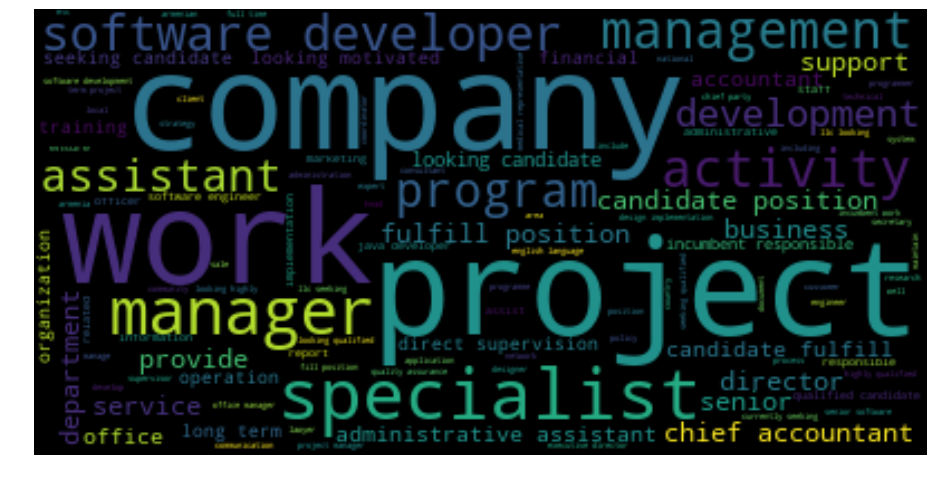

In [539]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Refining : Removing some worthless words that have surfaced in the word cloud and hence refining the results

In [546]:
for word in ['work','company','project','activity','fulfill position','department','development','candidate position',
                'senior','looking motivated','qualified candidate','looking candidate','fulfill position','provide',
             'office','program','support','responsible','incumbent','staff','operation']:
    text_new=text.replace(word,'')

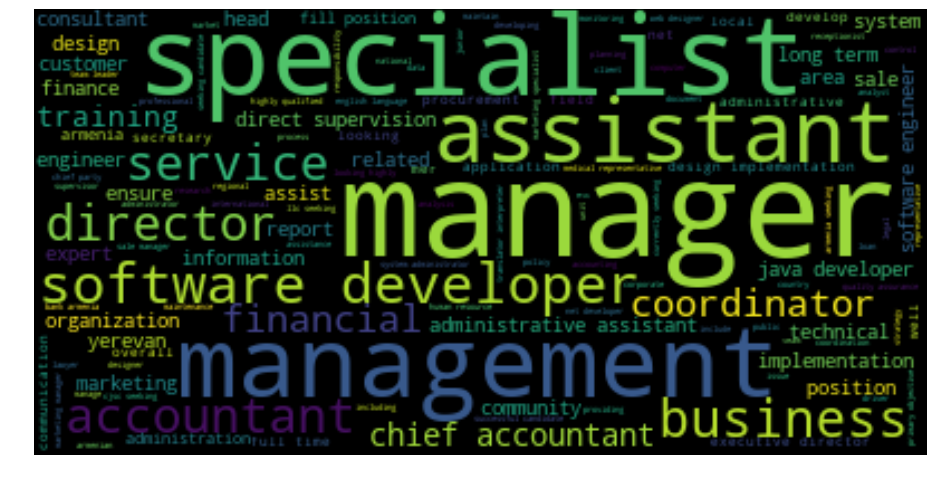

In [547]:
wordcloud = WordCloud(max_font_size=60).generate(text_new)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

###### Jobs in demand between 2008-20011

In [549]:
info=X['2008':'2011']

In [550]:
info.head()

,0
date,
2008-01-07,study united state institute summer
2008-01-07,category specialist
2008-01-08,senior software developer primary objective po...
2008-01-07,graphic designer firmplace corporation looking...
2008-01-07,scm engineer sw varnita ltd seeking scm engine...


In [551]:
text=' '.join(info[0])

In [552]:
text

'study united state institute summer category specialist senior software developer primary objective position produce required product conjunction team member insuring high quality timely graphic designer firmplace corporation looking innovative graphic designer work team member web based application development scm engineer sw varnita ltd seeking scm engineer maintain develop script procedure standard documentation report required support engineering project management related configuration management product net c software developer altacode llc seeking net c software developer responsible object oriented programming manual tester primary objective position ensure quality cqg product following enhancing sqa software quality assurance process sale spare part department manager capital market unit head multifunctional management position involving raising capital trough public equity debt market supporting activity incumbent responsible management development underwriting deal originat

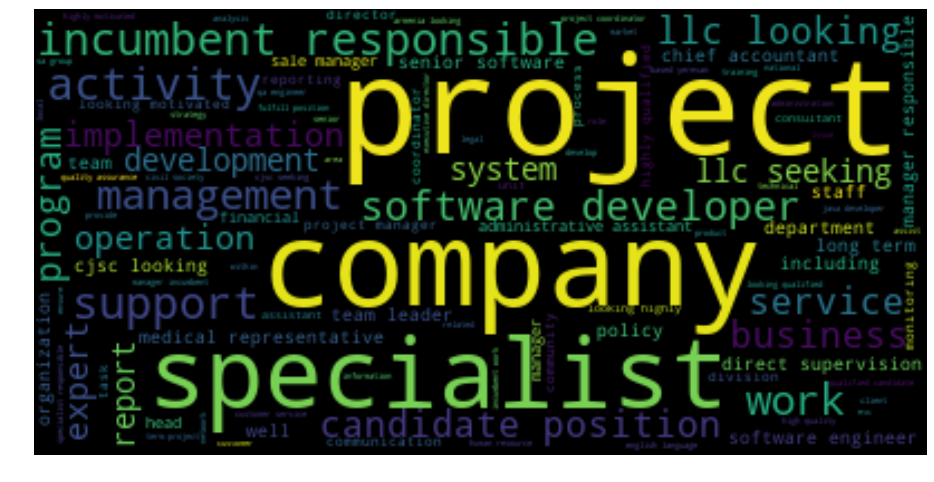

In [553]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Refining : Removing some worthless words that have surfaced in the word cloud and hence refining the results

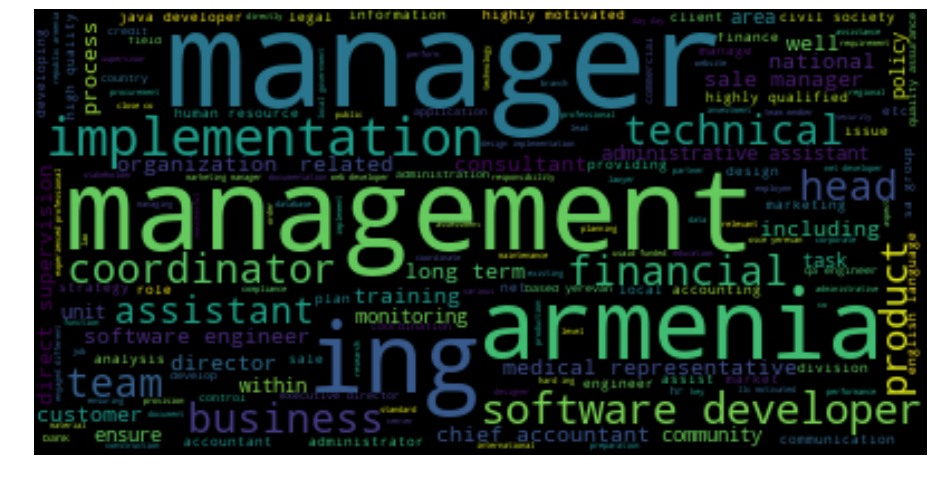

In [555]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

###### Jobs in demand between 20012-20015


In [556]:
info=X['2012':'2015']

In [557]:
info.head()

,0
date,
2012-01-09,education officer
2012-01-09,project manager operation department haypost c...
2012-01-09,audit manager
2012-01-09,legal assistant sa group llc seeking legal ass...
2012-01-09,sale department manager sale department manage...


In [558]:
text=' '.join(info[0])

In [560]:
text

'education officer project manager operation department haypost cjsc seeking project manager operation department depth understanding strategic sourcing supplier management responsible implementing logistics transport organization delivery strategy procedure according la poste business procedure requirement audit manager legal assistant sa group llc seeking legal assistant carry entry level paralegal responsibility legal department work independently minimal supervision perform administrative duty including creating preparing routine material proofreading verifying editing material extreme accuracy clarity sale department manager sale department manager involved coordination control sale process grand candy product supermarket director sa group llc seeking supermarket director responsible achieving sale service organization customer satisfaction profitability goal store compliance company procedure lawyer incumbent provide legal assistance development review different type contract agr

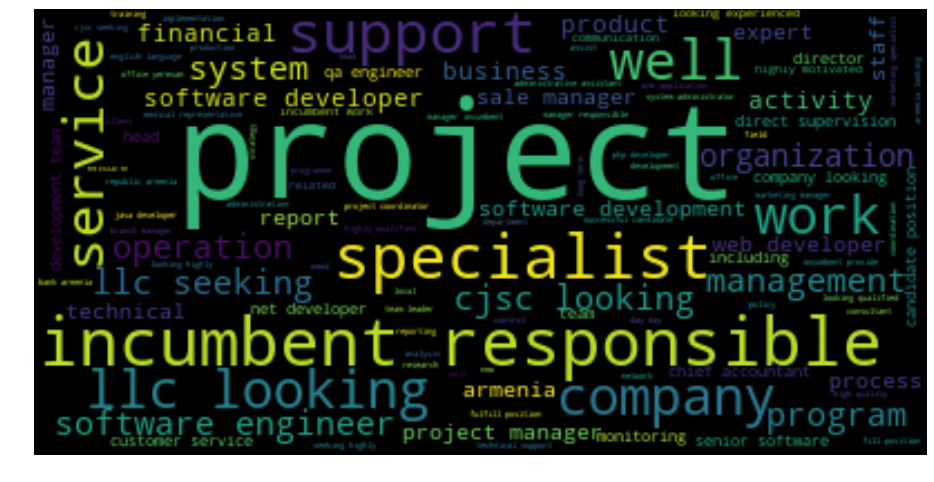

In [561]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Refining : Removing some worthless words that have surfaced in the word cloud and hence refining the results

In [567]:
for word in ['work','company','project','activity','fulfill position','department','development','candidate position',
                'senior','looking','qualified candidate','candidate','fulfill','position','provide',
             'office','program','support','responsible','incumbent','staff','operation','system','service','specialist',
             'report','team leader','expert','seeking','well','organization','armenia','cjsc','product','head','training'
            ,'ensure','implementation','program','service','']:
    text=text.replace(word,'')

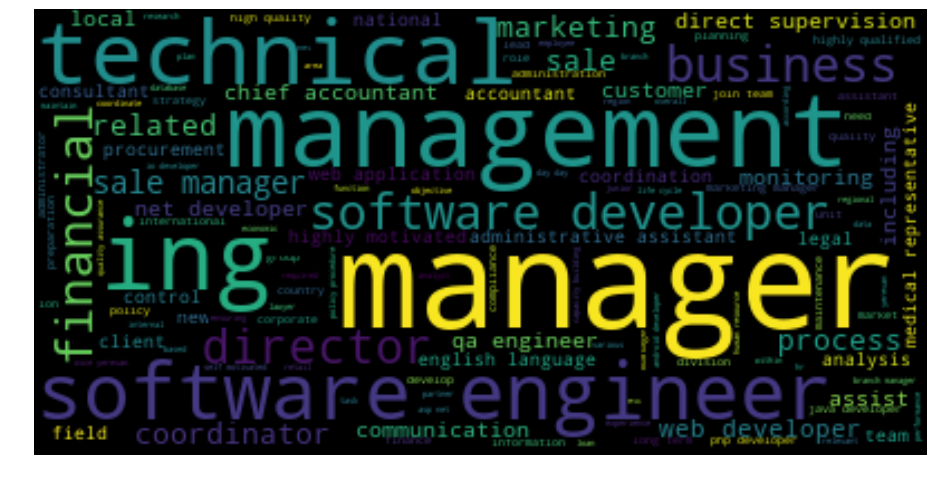

In [568]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Objective 2:- Desired Characteristics and Skill-Sets: 

What are the desired characteristics and skill-set of the candidates based on the job description dataset? How these are desired characteristics changing over time?  

For this we will focus on 2 variables job requirement and required skillset 

In [569]:
df_new=df[['JobDescription','RequiredQual']]
df_new.isnull().sum()

JobDescription    3892
RequiredQual       484
dtype: int64

In [570]:
df_new=df_new.apply(lambda x:treat_na(x))

In [572]:
df_new.isnull().sum()

JobDescription    0
RequiredQual      0
dtype: int64

In [573]:
df_new=df_new['JobDescription']+' '+df_new['RequiredQual']

In [575]:
df_new.isnull().sum()

0

### Data Preprocessing

In [576]:
# Creating the corpus

corpus = []
for i in range(0, len(df_new)):
    job_desc = re.sub(r'\W', ' ', str(df_new[i])) #removing all special symbols except ' _ '
    job_desc = job_desc.lower()
    job_desc = re.sub(r'^br$', ' ', job_desc) 
    job_desc = re.sub(r'\s+[a-z]\s+', ' ',job_desc)
    job_desc = re.sub(r'^[a-z]\s+', '', job_desc)
    job_desc=re.sub(r'[0-9]',' ',job_desc)
    
    job_desc = re.sub(r'\s+', ' ', job_desc) #Removing extra spaces between words
    corpus.append(job_desc) 

In [578]:
corpus[1]

' bachelor degree master is preferred excellent skills in spoken and written english and armenian languages past english to armenian translation and armenian to english translation experience good communication and public speaking skills ability to work independently and as part of team remuneration commensurate with experience '

In [579]:
#Removing all unimportant english words because they don not contribute to preditions 


for i in range(len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [word for word in words if word not in stopwords.words('english')]
    corpus[i] = ' '.join(words)               

In [580]:
#Reducing words to their root word via lemmatization



lemmatizer=WordNetLemmatizer()

for i in range(len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [lemmatizer.lemmatize(word) for word in words]
    corpus[i] = ' '.join(words)   

In [581]:
corpus[1]

'bachelor degree master preferred excellent skill spoken written english armenian language past english armenian translation armenian english translation experience good communication public speaking skill ability work independently part team remuneration commensurate experience'

In [582]:
X=pd.concat([df['date'],pd.DataFrame(corpus)],axis=1)

In [583]:
X['date']=pd.to_datetime(X['date'],errors='coerce')

In [584]:
X=X.set_index('date')

In [585]:
X.head()

,0
date,
2004-01-05,ameria investment consulting company seeking c...
2004-01-07,bachelor degree master preferred excellent ski...
2004-01-07,public outreach strengthening growing network ...
2004-01-07,lead local enhancement development health bcc ...
2004-01-10,university degree economical background plus e...


In [586]:
X.index.year.value_counts()

2012.0    1965
2013.0    1834
2014.0    1811
2008.0    1599
2011.0    1567
2007.0    1383
2010.0    1381
2015.0    1194
2009.0    1091
2005.0    1044
2006.0    1032
2004.0     803
Name: date, dtype: int64

So we are having information for 10 years from 2004 to 2015.

So diving these yearsinto group of 3 and observing how skill set nature is changing over time  by building WorldCloud.



###### Skill set in demand between 2004-2007

In [587]:
info=X['2004':'2007']

In [589]:
info.head()

,0
date,
2004-01-05,ameria investment consulting company seeking c...
2004-01-07,bachelor degree master preferred excellent ski...
2004-01-07,public outreach strengthening growing network ...
2004-01-07,lead local enhancement development health bcc ...
2004-01-10,university degree economical background plus e...


In [590]:
text=' '.join(info[0])

In [591]:
text

'ameria investment consulting company seeking chief financial officer position manages company fiscal administrative function provides highly responsible technically complex staff assistance executive director work performed requires high level technical proficiency financial management investment management well management supervisory administrative skill perform job successfully individual must able perform essential duty satisfactorily requirement listed representative knowledge skill ability required knowledge generally accepted accounting principle local accounting standard legislation state reporting requirement pertaining accounting principle practice financial management budgeting principle practice financial system design analysis principle practice contract management record management risk management principle practice management supervision principle practice information system management ability apply sound fiscal administrative practice company activity plan organize supe

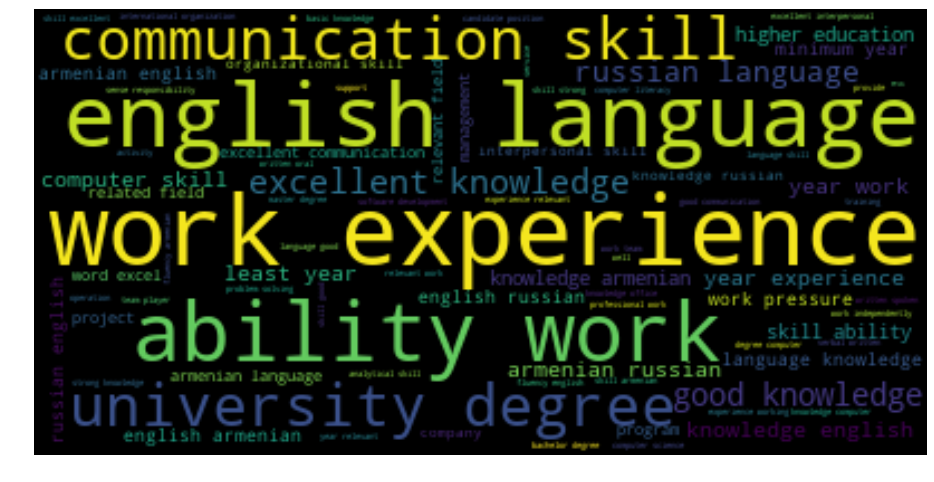

In [592]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Refining wordcloud by removing redundant words

In [593]:
for word in ['work','experience','university degree','good knowledge','ability work','excellent knowledge','least year',
             'work pressure','knowledge','related field','skill','ability']:
    text=text.replace(word,'')

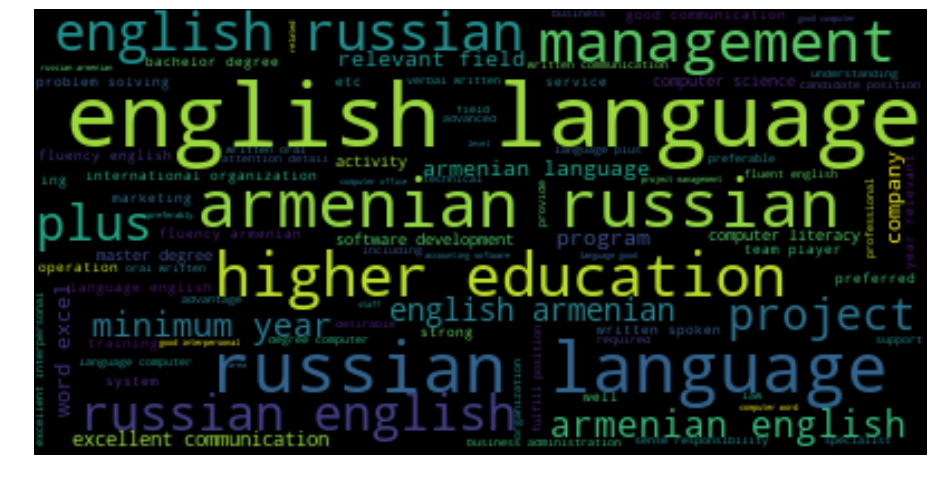

In [594]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

###### Skill set in demand between 2008-20011

In [596]:
info=X['2008':'2011']

In [597]:
info.head()

,0
date,
2008-01-07,
2008-01-07,higher education preferably marketing excellen...
2008-01-08,primary objective position produce required pr...
2008-01-07,firmplace corporation looking innovative graph...
2008-01-07,varnita ltd seeking scm engineer maintain deve...


In [598]:
text=' '.join(info[0])

In [599]:
text

' higher education preferably marketing excellent knowledge m office excellent knowledge armenian russian language knowledge english preferable excellent interpersonal communication skill excellent negotiation skill highly organized dedicated personality flexible working hour primary objective position produce required product conjunction team member insuring high quality timely bachelor degree computer science related discipline year object oriented development enterprise class system architecture design equivalent combination education skill experience knowledge unix platform technology including threading socket preferable demonstrated record designing implementing high quality software product delivered market real time programming experience strong problem solving skill ability successful member team good english language skill ability develop skill desire learn new technology knowledge application software development methodology preferably uml firmplace corporation looking innov

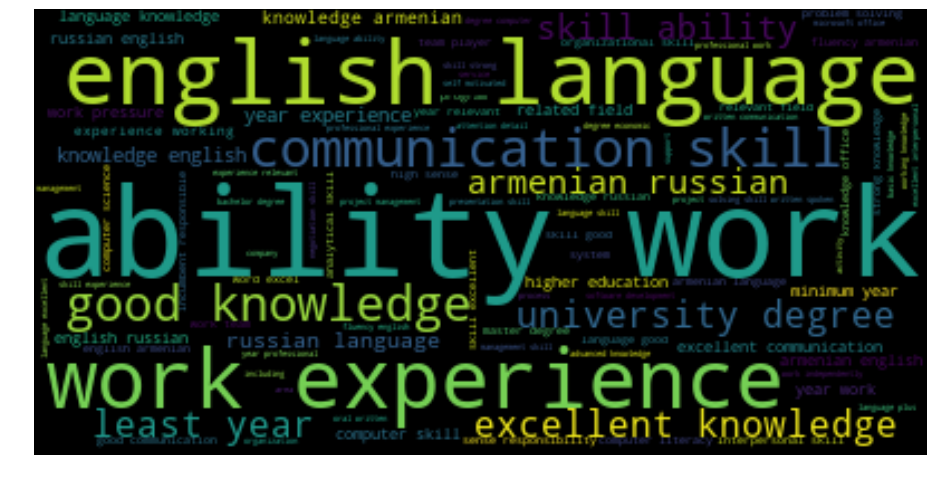

In [600]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Refining the word cloud by removing redundant words

In [601]:
for word in ['work','experience','university degree','good knowledge','ability work','excellent knowledge','least year',
             'work pressure','knowledge','related field','skill','ability']:
    text=text.replace(word,'')

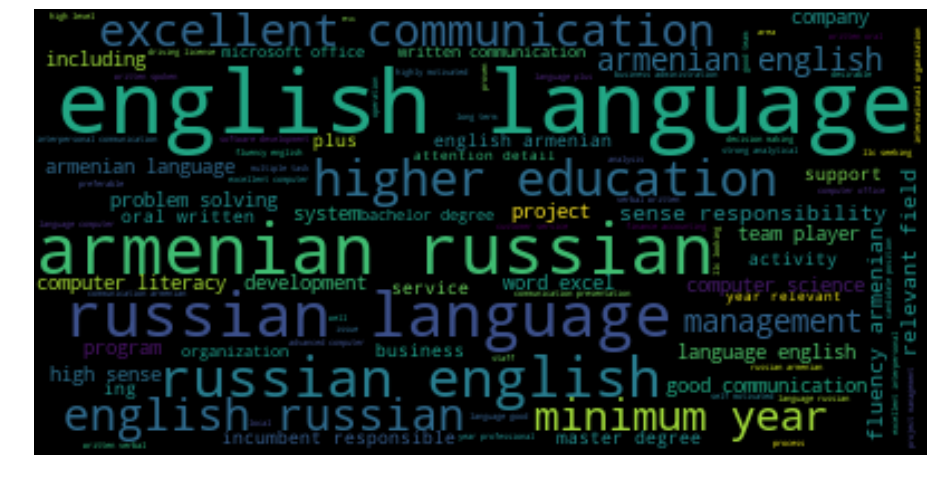

In [602]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

##### Skill set in demand between 2012-2015

In [603]:
info=X['2012':'2015']

In [604]:
info.head()

,0
date,
2012-01-09,university degree social science business admi...
2012-01-09,haypost cjsc seeking project manager operation...
2012-01-09,university degree accounting finance economics...
2012-01-09,sa group llc seeking legal assistant carry ent...
2012-01-09,sale department manager involved coordination ...


In [605]:
text=''.join(info[0])

In [606]:
text

'university degree social science business administration related field least year relevant professional experience least year within international organisation good familiarity situation refugee armenia fluency armenian good knowledge english language good drafting skill english excellent interpersonal communication coordination skillhaypost cjsc seeking project manager operation department depth understanding strategic sourcing supplier management responsible implementing logistics transport organization delivery strategy procedure according la poste business procedure requirement university degree mba plus least year work experience relevant field good analytical organizational skill excellent communication time management organizational skill attention detail excellent knowledge russian english language ability manage multiple task simultaneously excellent knowledge m office internetuniversity degree accounting finance economics ra auditor license mba cpa acca qualification desirab

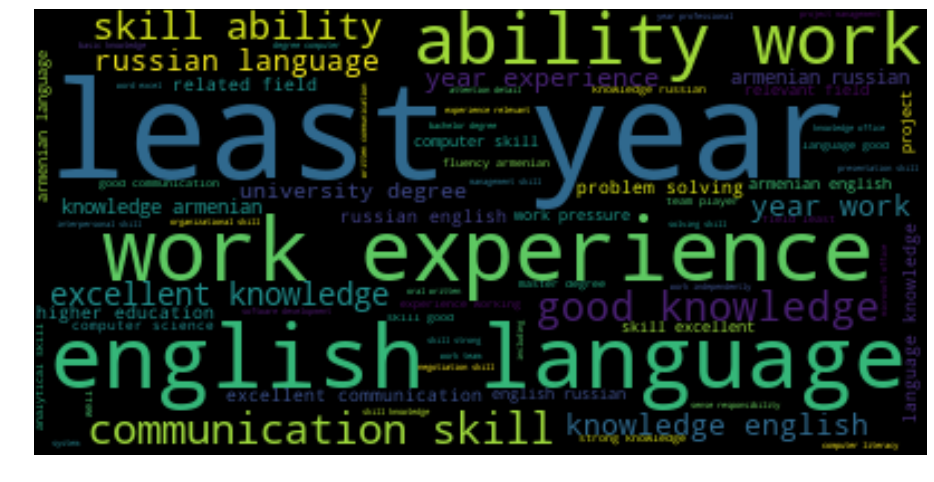

In [607]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Refining the wordcloud by removing redundant words

In [608]:
for word in ['work','experience','university degree','good knowledge','ability work','excellent knowledge','least year',
             'work pressure','knowledge','related field','skill','ability']:
    text=text.replace(word,'')

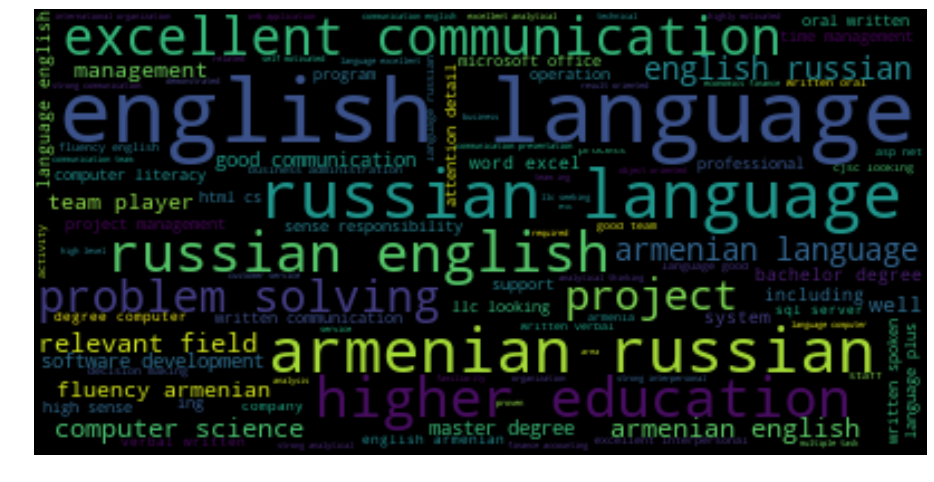

In [609]:
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(16,12))
# plot wordcloud in matplotlib
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Objective 3 :- IT Job Classification

Build a classifier that can tell us from the job description and company description whether a job is IT or not, so that this column can be automatically populated for new job postings. After doing so, understand what important factors are which drives this classification

For this we will concatenate following variables JobDescription JobRequirment RequiredQual  Title and Company.JobDescription JobRequirment RequiredQual  Title combined will tell us about job description and Company will tell us about company description 

In [80]:
df1=df[['Company','JobDescription' ,'JobRequirment','RequiredQual','Title']]
df1.isnull().sum()

Company              7
JobDescription    3892
JobRequirment     2522
RequiredQual       484
Title               28
dtype: int64

In [83]:
df1=df1.apply(lambda x:treat_na(x))

In [84]:
df1.isnull().sum()

Company           0
JobDescription    0
JobRequirment     0
RequiredQual      0
Title             0
dtype: int64

In [89]:
X=df1['Company']+' '+df1['Title']+' '+df1['JobDescription']+' '+df1['JobRequirment']+' '+df1['RequiredQual']

In [90]:
X.to_csv('objective_3_dataset.csv')

In [92]:
X.shape

(19001,)

In [95]:
X[1]

"International Research & Exchanges Board (IREX) Full-time Community Connections Intern (paid internship)   - Bachelor's Degree; Master's is preferred;\n- Excellent skills in spoken and written English and Armenian languages;\n- Past English to Armenian translation and Armenian to English\ntranslation experience;\n- Good communication and public speaking skills;\n- Ability to work independently and as part of a team.\nREMUNERATION:  Commensurate with experience."

In [23]:
y=df['IT'].map({True:1,False:0})

In [91]:
y.head()

0    0
1    0
2    0
3    0
4    1
Name: IT, dtype: int64

In [93]:
y.shape

(19001,)

### Data PreProcessing

In [96]:
# Creating the corpus

corpus = []
for i in range(0, len(X)):
    job_desc = re.sub(r'\W', ' ', str(X[i])) #removing all special symbols except ' _ '
    job_desc = job_desc.lower()
    job_desc = re.sub(r'^br$', ' ', job_desc) 
    job_desc = re.sub(r'\s+[a-z]\s+', ' ',job_desc)
    job_desc = re.sub(r'^[a-z]\s+', '', job_desc)
    job_desc=re.sub(r'[0-9]',' ',job_desc)
    
    job_desc = re.sub(r'\s+', ' ', job_desc) #Removing extra spaces between words
    corpus.append(job_desc) 

In [98]:
corpus[1]

'international research exchanges board irex full time community connections intern paid internship bachelor degree master is preferred excellent skills in spoken and written english and armenian languages past english to armenian translation and armenian to english translation experience good communication and public speaking skills ability to work independently and as part of team remuneration commensurate with experience '

In [99]:
#Removing all unimportant english words because they don not contribute to preditions 

from nltk.corpus import stopwords
for i in range(len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [word for word in words if word not in stopwords.words('english')]
    corpus[i] = ' '.join(words)               

In [100]:
#Reducing words to their root word via lemmatization

from nltk.stem import WordNetLemmatizer

lemmatizer=WordNetLemmatizer()

for i in range(len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [lemmatizer.lemmatize(word) for word in words]
    corpus[i] = ' '.join(words)   

In [103]:
corpus[1]

'international research exchange board irex full time community connection intern paid internship bachelor degree master preferred excellent skill spoken written english armenian language past english armenian translation armenian english translation experience good communication public speaking skill ability work independently part team remuneration commensurate experience'

In [104]:
# Creating the Tf-Idf Model

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features = 2000, min_df = 3, max_df = 0.6)
X = vectorizer.fit_transform(corpus).toarray()44444444444444444444444444999999999999yyyyyyyyyyyyyyyyy8064y077777777777777777777777777777777777777777777777777777777777777777777k4brehgjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjj52tttttttttttttttttttttttttttttgfyu2hhhhhhhh22heeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeedddddh22222222222222222222222hhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhuusbgggggggggggggg


In [105]:
X

array([[0.06964381, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.11988393, 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [106]:
X.shape

(19001, 2000)

In [107]:
y.shape

(19001,)

In [108]:
# Splitting the dataset into the Training set and Test set

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 469)

## Model Building

### 1. Naive Bayes

In [109]:
from sklearn.naive_bayes import MultinomialNB 

In [110]:
nb=MultinomialNB()

In [111]:
nb.fit(X_train,y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [112]:
y_pred=nb.predict(X_test)

In [114]:
# calculate accuracy of class predictions
from sklearn import metrics
print(metrics.accuracy_score(y_test, y_pred))

0.9192317811102342


In [122]:
print(metrics.accuracy_score(y_train, nb.predict(X_train)))

0.9155921052631579


So model is good .No overfitting or underfitting issue is present

In [118]:
pd.DataFrame({'Actual':y_test,'Predicted':y_pred}).head()

,Actual,Predicted
9965,0,0
8727,0,0
18497,0,0
6524,1,1
4081,0,0


In [116]:
# confusion matrix
print(metrics.confusion_matrix(y_pred, y_test))


[[2827  105]
 [ 202  667]]


In [119]:
 # predict (poorly calibrated) probabilities
    
y_pred_prob = nb.predict_proba(X_test)[:, 1]


In [120]:
# calculate AUC
print(metrics.roc_auc_score(y_test, y_pred_prob))


0.9542877401013006


### 2. Logistic Regression Model

In [124]:
print(X.shape)
print(y.shape)

(19001, 2000)
(19001,)


In [125]:
    from sklearn.decomposition import PCA

In [150]:
from sklearn.linear_model import LogisticRegression

In [151]:
lr=LogisticRegression()

In [152]:
lr.fit(X,y)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [153]:
y_pred=lr.predict(X_test)

In [157]:
 # calculate accuracy of class predictions

print(metrics.accuracy_score(y_test, y_pred))

0.9500131544330439


In [158]:
 
print(metrics.accuracy_score(y_train, lr.predict(X_train)))

0.9499342105263158


In [161]:
pd.DataFrame({'Actual':y_test,'Predicted':y_pred}).head()


,Actual,Predicted
9965,0,0
8727,0,0
18497,0,0
6524,1,1
4081,0,0


In [162]:
# confusion matrix
print(metrics.confusion_matrix(y_pred, y_test))


[[2966  127]
 [  63  645]]


In [164]:
 # predict (poorly calibrated) probabilities
    
y_pred_prob = lr.predict_proba(X_test)[:, 1]


In [165]:
# calculate AUC
print(metrics.roc_auc_score(y_test, y_pred_prob))


0.986325194963368


### Objective 4:- Similarity of Jobs

Given a job title, find the 5 top jobs that are of a similar nature, based on the job post.  

For this objective we have to focus on job title

In [348]:
x=df1['Title']

### Data PreProcessing

In [349]:
# Creating the corpus for x

corpus_x = []
for i in range(0, len(x)):
    job_desc = re.sub(r'\W', ' ', str(x[i])) #removing all special symbols except ' _ '
    job_desc = job_desc.lower()
    job_desc = re.sub(r'^br$', ' ', job_desc) 
    job_desc = re.sub(r'\s+[a-z]\s+', ' ',job_desc)
    job_desc = re.sub(r'^[a-z]\s+', '', job_desc)
    job_desc=re.sub(r'[0-9]',' ',job_desc)
    
    job_desc = re.sub(r'\s+', ' ', job_desc) #Removing extra spaces between words
    corpus_x.append(job_desc) 

In [350]:
corpus_x[1]

'full time community connections intern paid internship '

In [351]:
#Removing all unimportant english words from corpus_x 


for i in range(len(corpus_x)):
    words = nltk.word_tokenize(corpus_x[i])
    words = [word for word in words if word not in stopwords.words('english')]
    corpus_x[i] = ' '.join(words)               

In [352]:
#Reducing words to their root word via lemmatization in corpus_x



lemmatizer=WordNetLemmatizer()

for i in range(len(corpus_x)):
    words = nltk.word_tokenize(corpus_x[i])
    words = [lemmatizer.lemmatize(word) for word in words]
    corpus_x[i] = ' '.join(words)   

In [353]:
corpus_x[1]

'full time community connection intern paid internship'

In [354]:
# Creating the Tf-Idf Model


vectorizer = TfidfVectorizer(max_features = 2000, min_df = 3, max_df = 0.6)
x = vectorizer.fit_transform(corpus_x).toarray()


In [355]:
x

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [356]:
x.shape

(19001, 1250)

In [233]:
from sklearn.neighbors import NearestNeighbors

In [371]:
#Let us take a job title for which we have to obtain simmilar jobs or neighbors

job_title=['cheif accountant']

In [372]:
Y=vectorizer.transform(job_title).toarray()

In [373]:
Y

array([[0., 0., 0., ..., 0., 0., 0.]])

In [388]:
#Showing 20 similar jobs rather than 5

neigh = NearestNeighbors(n_neighbors=20,n_jobs=-1,radius=0.1)
neigh.fit(x)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='minkowski',
         metric_params=None, n_jobs=-1, n_neighbors=20, p=2, radius=0.1)

In [389]:
#These are the 5 simmilar jobs matching our given job-title.They are in T-Idf transformed value
i,j=neigh.kneighbors(Y)
print(i)
print(j)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
[[14728 15600 15784   577  1656  7575  8377 15927  4031   715 11249  8415
   2904  4176  3863  3389 15792  3566  1692  1872]]


In [390]:
#Converting it into 2d array

o=np.array([i,j])

In [391]:
o

array([[[    0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.]],

       [[14728., 15600., 15784.,   577.,  1656.,  7575.,  8377., 15927.,
          4031.,   715., 11249.,  8415.,  2904.,  4176.,  3863.,  3389.,
         15792.,  3566.,  1692.,  1872.]]])

In [392]:
#inverse transforming the obtained value to get meaningful data
#showing 20 similar jobs insted of 5 to bring more clarity
vectorizer.inverse_transform(o)

[array([], dtype='<U17'),
 array(['abovyan', 'access', 'account', 'accountant', 'accounting',
        'achajour', 'acquisition', 'action', 'actionscript', 'active',
        'activity', 'actuary', 'ad', 'added', 'adjuster', 'admin',
        'administration', 'administrative', 'administrator', 'admission'],
       dtype='<U17')]